In [38]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import pandas as pd
import numpy as np
import regex as re
import matplotlib.pyplot as plt
import string
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn import preprocessing
from scipy.spatial.distance import pdist, squareform
import scipy.cluster.hierarchy

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [39]:
df = pd.read_csv("/kaggle/input/youtube-videos-and-the-comments/YT_Videos_Comments.csv")#Creating the dataframe

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3553: DtypeWarning: Columns (2,3,4,5,6,7,8) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 861962 entries, 0 to 861961
Data columns (total 9 columns):
 #   Column                     Non-Null Count   Dtype 
---  ------                     --------------   ----- 
 0   User                       861962 non-null  object
 1   Video Title                861813 non-null  object
 2   Video Description          665195 non-null  object
 3   Video ID                   432632 non-null  object
 4   Comment (Displayed)        394587 non-null  object
 5   Comment (Actual)           379081 non-null  object
 6   Comment Author             379053 non-null  object
 7   Comment Author Channel ID  379094 non-null  object
 8   Comment Time               379100 non-null  object
dtypes: object(9)
memory usage: 59.2+ MB


In [41]:
df = df.dropna()#dropping the rows with NaN values

In [42]:
df = df.sample(frac=1)#shuffling the dataset

In [43]:
#Creating a list of lists of words in the comments
i=0
list_of_sent=[]
for sent in df['Comment (Actual)'].values:
    sent=str(sent)
    list_of_sent.append(sent.split())

In [44]:
stops = set(stopwords.words("english"))

In [45]:
def cleanhtml(sentence): #function to clean the word of any html-tags
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext
def cleanpunc(sentence): #function to clean the word of any punctuation or special characters
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned

In [46]:
# Creating a List of comments separated into words after cleaning the text
i=0
list_of_sent_train=[]
for sent in df['Comment (Actual)']:
    filtered_sentence=[]
    sent=str(sent)
    sent=cleanhtml(sent)
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    
                filtered_sentence.append(cleaned_words.lower())
            else:
                continue 
    list_of_sent_train.append(filtered_sentence)

In [47]:
len(list_of_sent_train)

379032

In [48]:
import gensim
# Training the wor2vec model using train dataset
w2v_model=gensim.models.Word2Vec(list_of_sent_train, workers=4)

In [49]:
import numpy as np
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this train
for sent in list_of_sent_train: # for each review/sentence
    sent_vec = np.zeros(100) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
        except:
            pass
    sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
sent_vectors = np.array(sent_vectors)
sent_vectors = np.nan_to_num(sent_vectors)
sent_vectors.shape

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]


(379032, 100)

In [50]:
#Reducing the vectorised array to 1 dimension
pca1 = PCA(n_components = 1)
sent_vectors = pca1.fit_transform(sent_vectors)

In [51]:
#Creating a new dataframe out of original one
df2 = df.filter(['User', 'Video Title', 'Comment Author'], axis=1)

In [52]:
#Converting numpy array into a list
sent_vectors_new = []
for sent_vector in sent_vectors:
    sent_vector = sent_vector[0]
    sent_vectors_new.append(sent_vector)

In [53]:
df2['Comment (Actual)'] = sent_vectors_new
df2

,User,Video Title,Comment Author,Comment (Actual)
180711,Physics Girl,It's Official: We Were WRONG About the Big Bang,Farhaan Elaheebocus,-2.225983
737086,Physics Girl,Can you solve the BOWL RIDDLE? ft. Kurt Hugo S...,Jeremy MAGNE,-2.696498
95846,neo,How One Ship Caused a Global Traffic Jam,Stricker sniper,-0.497468
725244,Physics Girl,Singing this Note is IMPOSSIBLE!,Brylenn Jones,0.906650
280786,Physics Girl,How the Edge of Our Galaxy Defies Known Physics,Mr N A,-1.740550
...,...,...,...,...
839304,Physics Girl,Can you solve these physics riddles? ft Simone...,ajamit007,-2.859083
330257,Physics Girl,Why This Stuff Costs $2700 Trillion Per Gram -...,wendell benoit,-1.658235
860946,Physics Girl,The black hole death problem,Jess K,3.451579
168134,Physics Girl,What happened to my face,USN Patriot,-0.117971


In [54]:
#Performing label encoding on the categorical variables
label_encoder = preprocessing.LabelEncoder()
df2['User']= label_encoder.fit_transform(df['User'])

df2['Video Title']= label_encoder.fit_transform(df['Video Title'])

df2['Comment Author']= label_encoder.fit_transform(df['Comment Author'])

In [55]:
df2

,User,Video Title,Comment Author,Comment (Actual)
180711,2,129,61824,-2.225983
737086,2,34,89061,-2.696498
95846,3,90,176150,-0.497468
725244,2,171,29342,0.906650
280786,2,104,128440,-1.740550
...,...,...,...,...
839304,2,37,204937,-2.859083
330257,2,275,242206,-1.658235
860946,2,205,89481,3.451579
168134,2,250,191406,-0.117971


# **Performing K-means clustering on the complete dataset.**

In [56]:
#Creating the Kmeans clustering model
from sklearn.cluster import KMeans
model2 = KMeans(n_clusters = 2, n_init=10)
model2.fit(df2)

KMeans(n_clusters=2)

In [57]:
word_cluster_pred=model2.predict(df2)
word_cluster_pred_2=model2.labels_
word_cluster_center=model2.cluster_centers_

In [58]:
model2.labels_

array([1, 1, 0, ..., 1, 0, 1], dtype=int32)

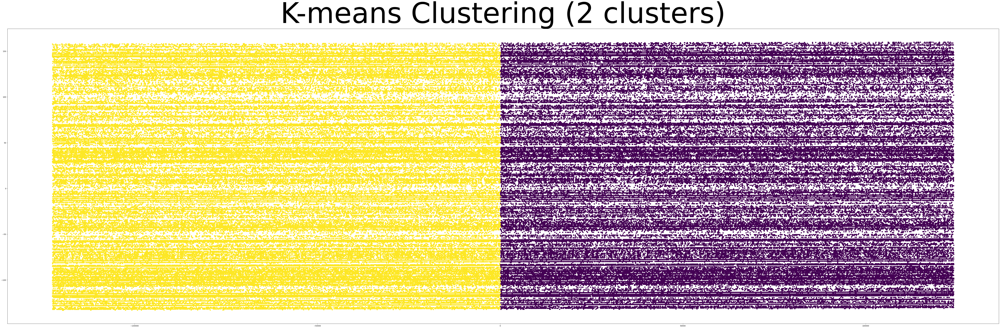

In [59]:
#Visualising the clusters
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df2)
plt.figure(figsize=(100,30))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=model2.labels_)
plt.title('K-means Clustering (2 clusters)', fontsize=160)
plt.show()

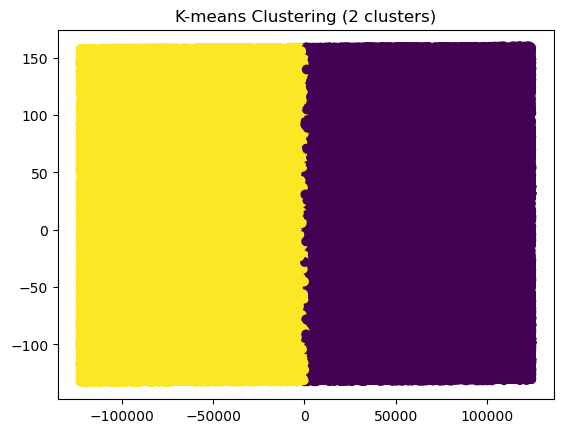

In [60]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df2)
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=model2.labels_)
plt.title('K-means Clustering (2 clusters)')
plt.show()

# **Performing Hierchical Clustering on a sample of 1000 points from the dataset.**

In [61]:
i=0
list_of_sent_train=[]
for i in range(1000):
    sent = list_of_sent[i]
    filtered_sentence=[]
    sent=str(sent)
    sent=cleanhtml(sent)
    for w in sent.split():
        for cleaned_words in cleanpunc(w).split():
            if(cleaned_words.isalpha()):    
                filtered_sentence.append(cleaned_words.lower())
            else:
                continue 
    list_of_sent_train.append(filtered_sentence)

In [62]:
import gensim
# Training the wor2vec model using train dataset
w2v_model=gensim.models.Word2Vec(list_of_sent_train, workers=4)

In [63]:
import numpy as np
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this train
for sent in list_of_sent_train: # for each review/sentence
    sent_vec = np.zeros(100) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        try:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
        except:
            pass
    sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
sent_vectors = np.array(sent_vectors)
sent_vectors = np.nan_to_num(sent_vectors)
sent_vectors.shape

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]


(1000, 100)

In [64]:
pca2 = PCA(n_components = 2)
sent_vectors_2d = pca2.fit_transform(sent_vectors)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:10: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  # Remove the CWD from sys.path while we load stuff.


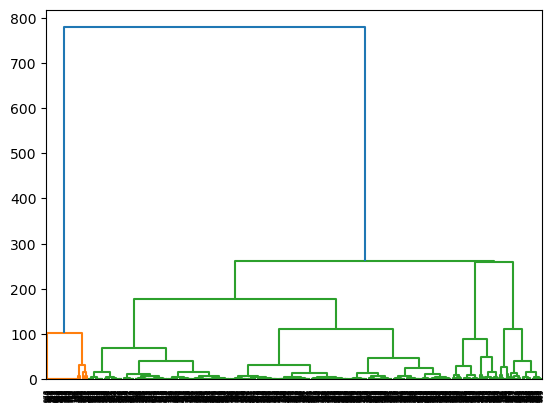

In [65]:
from sklearn.cluster import AgglomerativeClustering
# Compute the distance matrix
dist_matrix = squareform(pdist(sent_vectors_2d, metric='euclidean'))

# Perform hierarchical clustering
clustering = AgglomerativeClustering(n_clusters=2, linkage='ward').fit(sent_vectors_2d)

# Plot the dendrogram
from scipy.cluster.hierarchy import dendrogram, linkage
linkage_matrix = linkage(dist_matrix, method='ward')
dendrogram(linkage_matrix)

# Assign data points to clusters
labels = clustering.labels_

In [66]:
print(labels)

[0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 1 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 0 0 0 0 1
 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 1 0 0
 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0 1 0 0 